# Image2Image Translation with CycleGAN

## Import Libraries, Load Cycle2Monet, and Data

In [6]:
from glob import glob
import shutil
import urllib.request
import zipfile
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pytorch_fid import fid_score
from skimage.io import imread
import torch
from torch import nn
import torchvision.transforms as T
import torchvision.models as models
from pytorch_fid import fid_score
import pandas as pd

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.metrics import structural_similarity
import clip
from sklearn.metrics.pairwise import cosine_similarity

In [7]:
# Clone the repository and nanvigate into the directory
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix
%cd pytorch-CycleGAN-and-pix2pix

fatal: destination path 'pytorch-CycleGAN-and-pix2pix' already exists and is not an empty directory.
/Users/sebastianuedingslohmann/Desktop/CV_Project/Advanced-Machine-Learning-for-Computer-Vision/pytorch-CycleGAN-and-pix2pix


In [8]:
# Create directory
os.makedirs("checkpoints/monet2photo_pretrained", exist_ok=True)

# Download pretrained model
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/pretrained_models/monet2photo.pth",
    "checkpoints/monet2photo_pretrained/latest_net_G.pth")

('checkpoints/monet2photo_pretrained/latest_net_G.pth',
 <http.client.HTTPMessage at 0x14daba6c0>)

In [9]:
# Download Monet2Photo
os.makedirs("datasets", exist_ok=True)
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/monet2photo.zip",
    "datasets/monet2photo.zip")

with zipfile.ZipFile("datasets/monet2photo.zip", 'r') as zip_ref:
    zip_ref.extractall("datasets/")
os.remove("datasets/monet2photo.zip")

In [10]:
# Same for Cezanne2Photo
urllib.request.urlretrieve(
    "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/cezanne2photo.zip",
    "datasets/cezanne2photo.zip")

with zipfile.ZipFile("datasets/cezanne2photo.zip", 'r') as zip_ref:
    zip_ref.extractall("datasets/")
os.remove("datasets/cezanne2photo.zip")

In [26]:
def count_images(path):
    return len([
        f for f in os.listdir(path)
        if f.lower().endswith((".jpg", ".png", ".jpeg"))])

def dataset_stats(base_path):
    return {
        "Train paintings": count_images(os.path.join(base_path, "trainA")),
        "Train real images": count_images(os.path.join(base_path, "trainB")),
        "Test paintings": count_images(os.path.join(base_path, "testA")),
        "Test real images": count_images(os.path.join(base_path, "testB")),}

In [13]:
monet_stats = dataset_stats("datasets/monet2photo")
cezanne_stats = dataset_stats("datasets/cezanne2photo")

In [14]:
df_counts = pd.DataFrame.from_dict(
    {"Monet": monet_stats, "Cezanne": cezanne_stats}, orient="index")

display(df_counts)

,Train paintings,Train real images,Test paintings,Test real images
Monet,1072,6287,121,751
Cezanne,525,6287,58,751


The Monet dataset contains 1072 training paintings and 121 test paintings, while the Cézanne dataset includes 525 training paintings and 58 test paintings, which is notably less compared to Monet. These set size differences, particularly the small Cezanne test set, may affect the reliability and comparability of quantitative metrics between the two artists. For real images, we only use the photos from the Monet dataset, consisting of 6287 training images and 751 test images.

## Exploratory Data Analysis

In [15]:
# Path to the directory containing Monet training images
monet_train_images_path = "datasets/monet2photo/trainA" 
photo_images_path = "datasets/monet2photo/trainB"
cezanne_train_images_path = "datasets/cezanne2photo/trainA"
monet_test_images_path = "datasets/monet2photo/testA"

# Function to list first n image files in a folder
def list_first_n_images(folder, n=100):
    files = [f for f in os.listdir(folder) if f.lower().endswith((".png", ".jpg", ".jpeg"))]
    files.sort()
    return files[:n]

# Function to display first 100 images in a folder
def show_first_100(folder, title, resize_to=(64, 64)):
    image_files = list_first_n_images(folder, n=100)

    fig, axes = plt.subplots(10, 10, figsize=(15, 15))
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes.flat):
        ax.axis("off")
        if i < len(image_files):
            img_path = os.path.join(folder, image_files[i])
            try:
                img = Image.open(img_path).convert("RGB").resize(resize_to)
                ax.imshow(img)
            except Exception:
                ax.text(0.5, 0.5, "ERR", ha="center", va="center", fontsize=10)

    plt.tight_layout()
    plt.show()

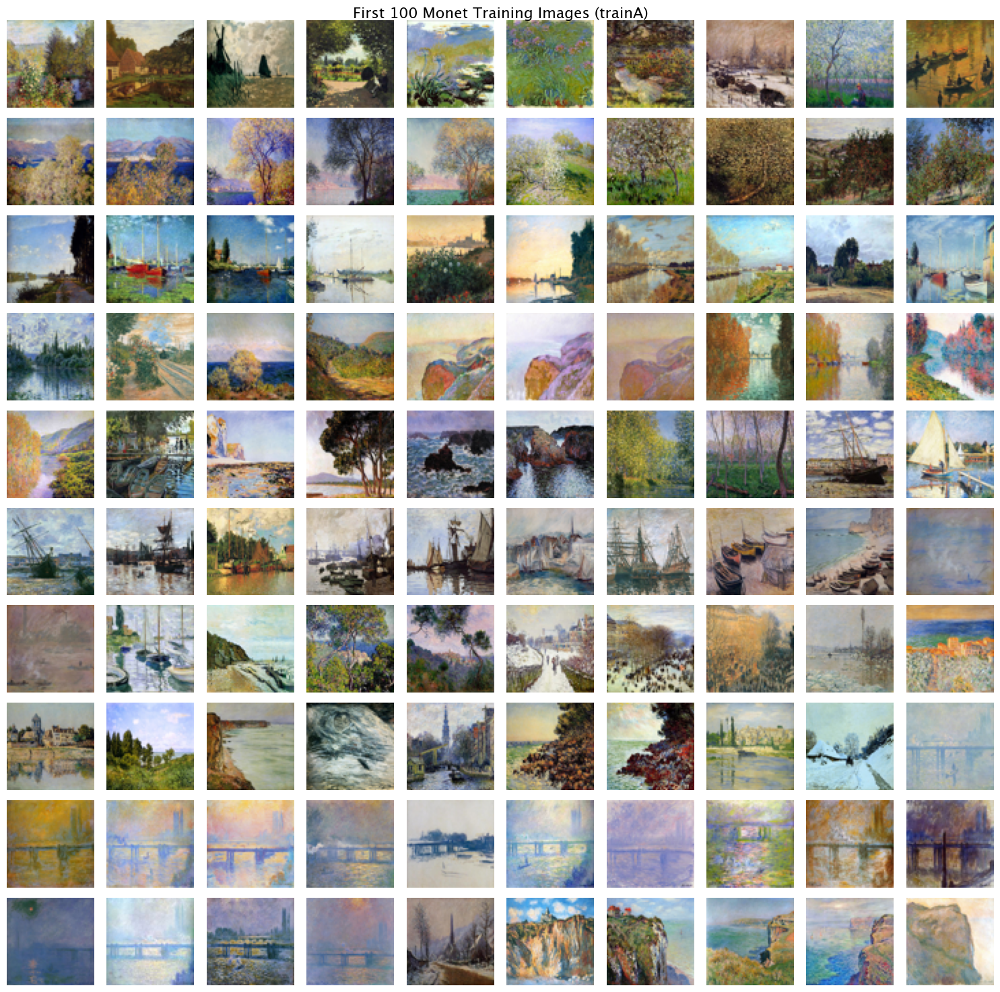

In [16]:
show_first_100(monet_train_images_path, "First 100 Monet Training Images (trainA)")

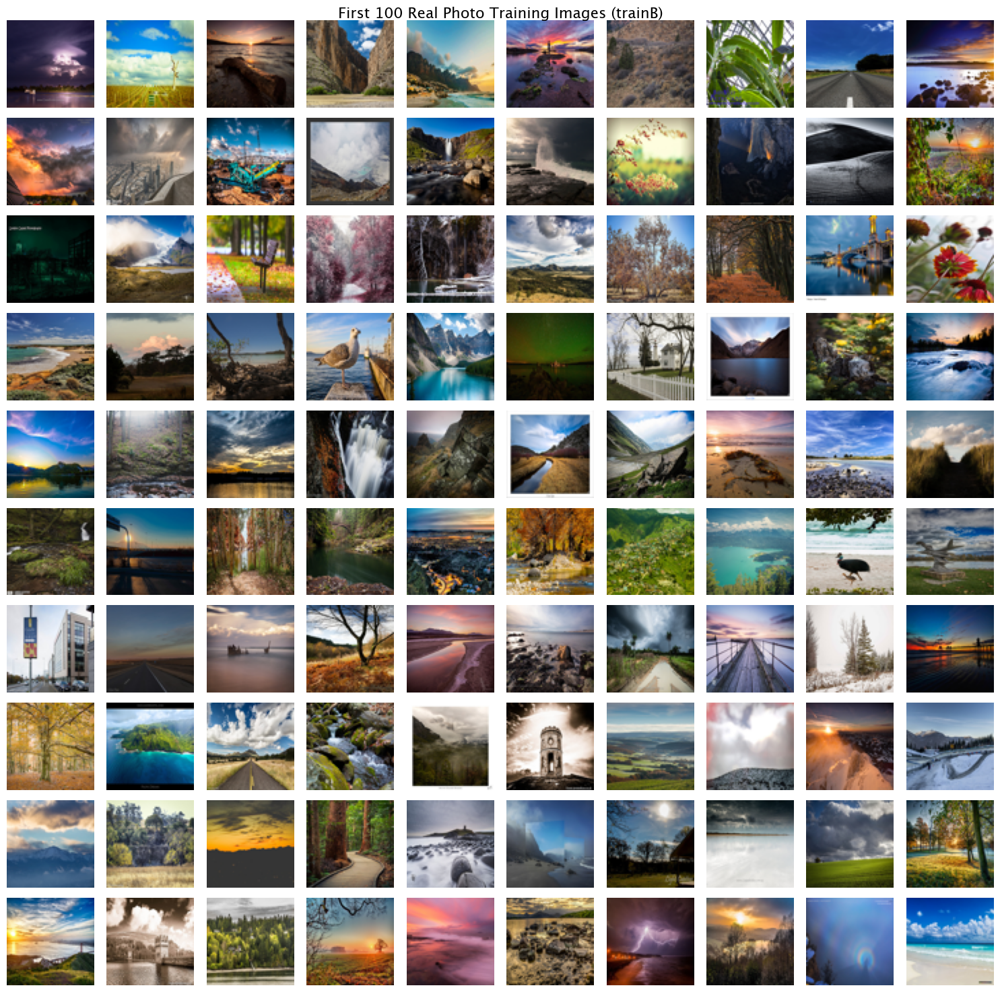

In [17]:
show_first_100(photo_images_path, "First 100 Real Photo Training Images (trainB)")

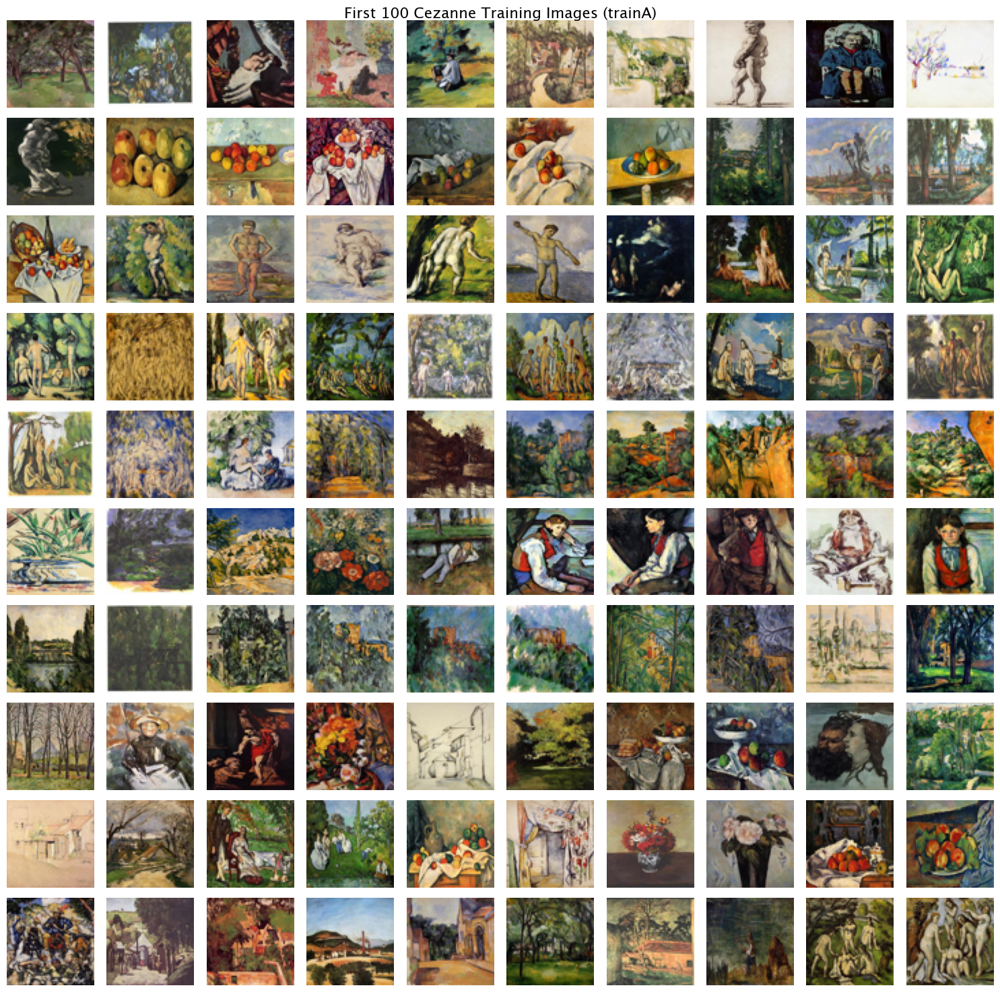

In [18]:
show_first_100(cezanne_train_images_path, "First 100 Cezanne Training Images (trainA)")

A visual inspection shows clear differences between the real photos and the paintings. The real photos are sharp, with clear edges, strong contrast, and realistic lighting. Objects are well defined and details are clearly visible.
The Monet paintings look much softer in comparison. Edges are blurred, details are less distinct, and colors blend smoothly into each other. The images focus more on overall mood and color than on precise structure.
Cézanne paintings share the painterly style of Monet but appear more structured. Shapes are more clearly outlined, and there is stronger contrast in some areas. While both styles differ strongly from real photos, Monet and Cézanne also differ noticeably from each other.

In [19]:
def get_image_sizes_and_colors(folder):
    """Get sizes and color distributions of images in a folder."""
    sizes = []
    color_distributions = []

    for img_file in list_first_n_images(folder, n=None):  # Process all images
        img_path = os.path.join(folder, img_file)
        try:
            img = Image.open(img_path).convert("RGB")
            sizes.append(img.size)
            color_distributions.append(img.histogram())
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return sizes, color_distributions

def print_image_size_stats(sizes, title):
    """Print min and max of width and height, and check for outliers."""
    widths, heights = zip(*sizes)
    min_width, max_width = min(widths), max(widths)
    min_height, max_height = min(heights), max(heights)
    print(f"{title} - Width: Min={min_width}, Max={max_width}, Height: Min={min_height}, Max={max_height}")
    
    # Check if any image falls out of line
    for i, (w, h) in enumerate(sizes):
        if w != min_width or h != min_height:
            print(f"Outlier detected: Image {i} has size ({w}, {h})")

In [20]:
datasets = {
    "Monet Train": monet_train_images_path,
    "Monet Test": monet_test_images_path,
    "Cezanne Train": cezanne_train_images_path,
    "Photos Train": photo_images_path}

In [21]:
image_sizes = {}

for name, path in datasets.items():
    sizes, _ = get_image_sizes_and_colors(path)
    image_sizes[name] = sizes
    print_image_size_stats(sizes, name)

Monet Train - Width: Min=256, Max=256, Height: Min=256, Max=256
Monet Test - Width: Min=256, Max=256, Height: Min=256, Max=256
Cezanne Train - Width: Min=256, Max=256, Height: Min=256, Max=256
Photos Train - Width: Min=256, Max=256, Height: Min=256, Max=256


In [22]:
def plot_color_distribution(color_distributions, title, ymax=None):
    avg_hist = np.mean(np.array(color_distributions, dtype=np.float64), axis=0)

    r = avg_hist[:256]
    g = avg_hist[256:512]
    b = avg_hist[512:768]

    r /= r.sum() + 1e-12
    g /= g.sum() + 1e-12
    b /= b.sum() + 1e-12

    x = np.arange(256)

    fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
    fig.suptitle(f"Average color distribution — {title}", fontsize=14)

    axes[0].plot(x, r, color="darkred")
    axes[0].set_title("Red")
    axes[0].set_xlabel("intensity (0–255)")
    axes[0].set_ylabel("frequency (normalized)")

    axes[1].plot(x, g, color="darkgreen")
    axes[1].set_title("Green")
    axes[1].set_xlabel("intensity (0–255)")

    axes[2].plot(x, b, color="darkblue")
    axes[2].set_title("Blue")
    axes[2].set_xlabel("intensity (0–255)")

    if ymax is not None:
        for ax in axes:
            ax.set_ylim(0, ymax)

    plt.tight_layout()
    plt.show()

In [23]:
color_hists = {}

for name, path in datasets.items():
    _, histograms = get_image_sizes_and_colors(path)
    color_hists[name] = histograms

In [24]:
global_ymax = 0.0

for hists in color_hists.values():
    avg_hist = np.mean(np.array(hists, dtype=np.float64), axis=0)

    r = avg_hist[:256]
    g = avg_hist[256:512]
    b = avg_hist[512:768]

    r /= r.sum() + 1e-12
    g /= g.sum() + 1e-12
    b /= b.sum() + 1e-12

    global_ymax = max(global_ymax, r.max(), g.max(), b.max())

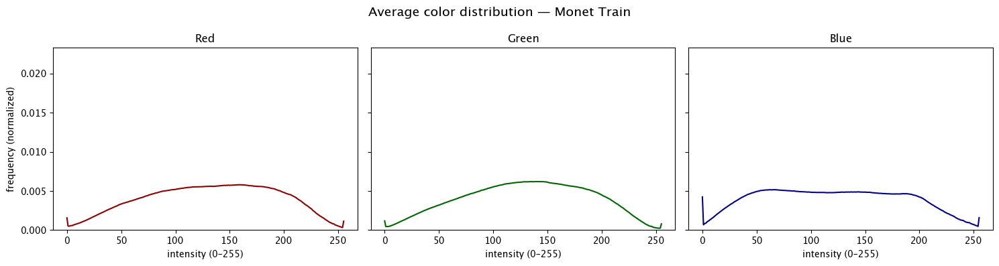

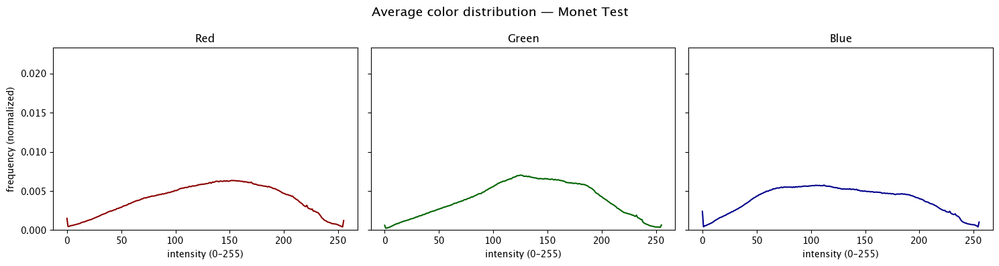

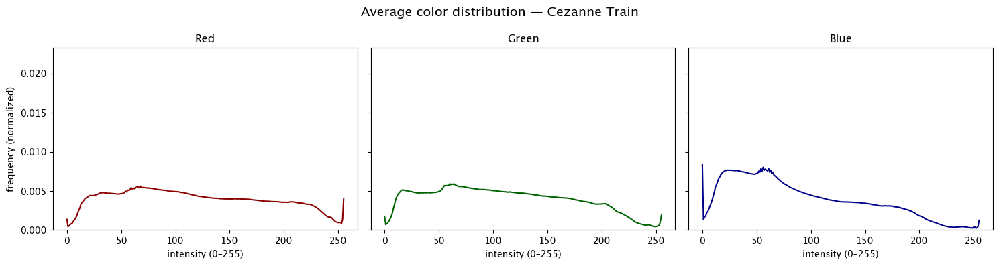

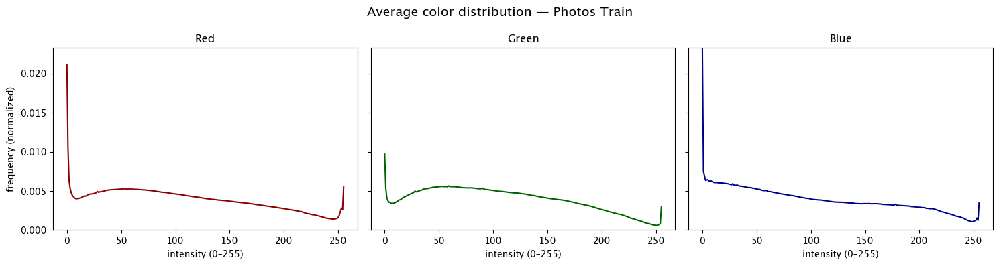

In [28]:
for name, hists in color_hists.items():
    plot_color_distribution(hists, name, ymax=global_ymax)

The average color distributions further highlight the differences between the domains. The real photos show strong peaks at very low intensity values, especially in the blue and red channels, which reflects dark regions, shadows, and high contrast in real photos. Their distributions are more uneven and skewed across intensities.

In contrast, both Monet and Cézanne paintings have smoother and more balanced color distributions. Intensities are more concentrated in the mid-range, with fewer extreme dark or bright values. Monet paintings show relatively similar distributions across color channels, while Cézanne exhibits stronger variations, particularly in the blue channel. Overall, the plots confirm that the artistic domains differ systematically from real photographs and also from each other in their use of color

In [27]:
# Compare the FID scores between both artists training sets
fid_value = fid_score.calculate_fid_given_paths(
    ["datasets/cezanne2photo/trainA",
     "datasets/monet2photo/trainA"],
    batch_size=20,
    device="cpu",
    dims=2048)

print(f"FID: {fid_value:.2f}")

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /Users/sebastianuedingslohmann/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth


100%|██████████| 91.2M/91.2M [00:05<00:00, 18.5MB/s]
100%|██████████| 54/54 [02:41<00:00,  3.00s/it]


FID: 142.97


To further quantify the difference between the Monet and Cézanne paintings, we compute the Fréchet Inception Distance (FID) between their training sets. At this stage, FID is used only as a descriptive measure for the distance of the distributions, without interpreting it as an evaluation metric. A detailed explanation of FID and its limitations is provided later in the quantitative evaluation section. For now, it is sufficient to note that the high FID value indicates a substantial difference between the two artistic domains.

## Image Translations

In [30]:
# Test on previously unseen Monet paintings
!python test.py \
    --dataroot datasets/monet2photo/testA \
    --name monet2photo_pretrained \
    --model test \
    --no_dropout \
    --num_test 121 \
    --phase test_monet

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: datasets/monet2photo/testA    	[default: None]
             dataset_mode: single                        
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                             	[default: 0]
                load_size: 256             

In [31]:
# Test on Cezanne paintings
!python test.py \
    --dataroot datasets/cezanne2photo/trainA \
    --name monet2photo_pretrained \
    --model test \
    --no_dropout \
    --num_test 525 \
    --phase train \
    --results_dir results_on_training_data_cz

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: datasets/cezanne2photo/trainA 	[default: None]
             dataset_mode: single                        
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                             	[default: 0]
                load_size: 256             

In [32]:
def compare_single_pair(real_path, fake_path, figsize=(12, 6)):
    """ Display one pair of real and fake images side-by-side """
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Load images
    real_img = Image.open(real_path)
    fake_img = Image.open(fake_path)
    
    # Display images
    axes[0].imshow(real_img)
    axes[0].set_title("Original")
    axes[0].axis("off")
    
    axes[1].imshow(fake_img)
    axes[1].set_title("Generated")
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

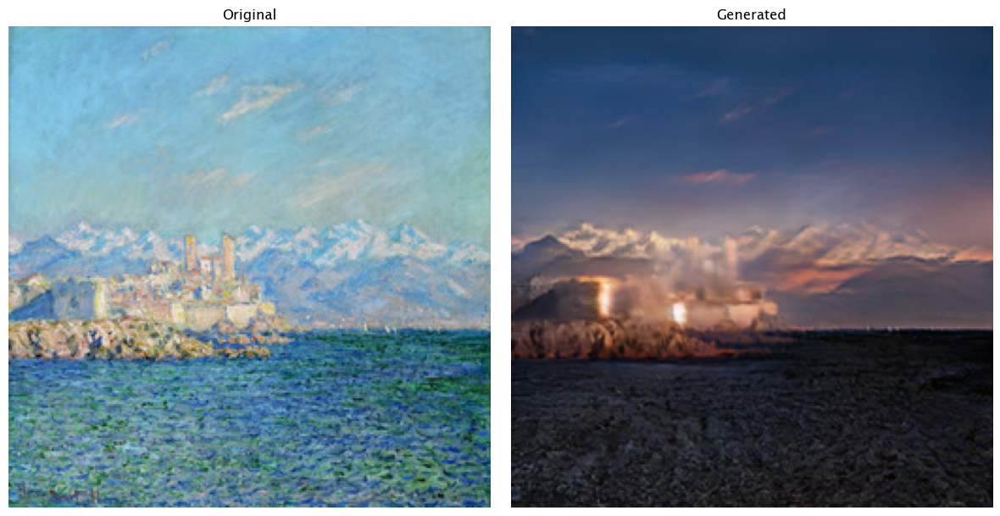

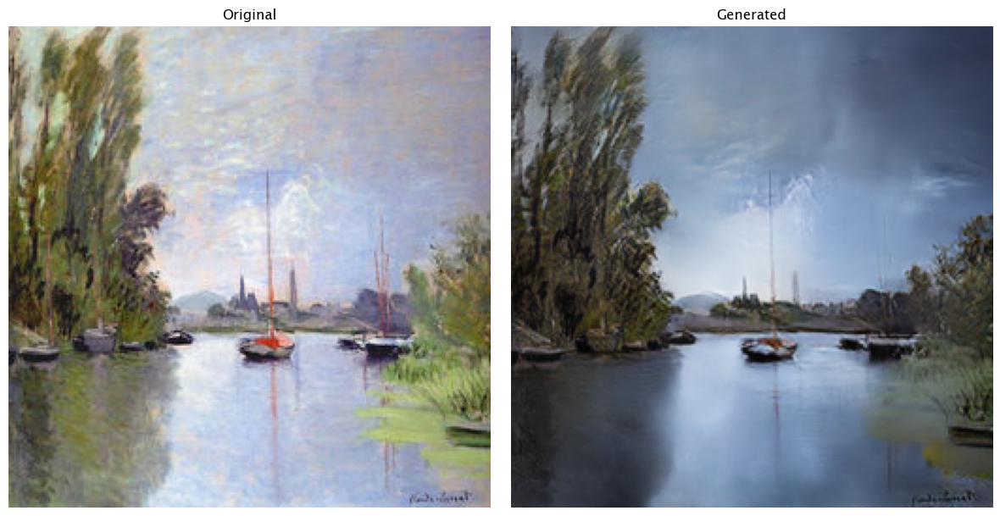

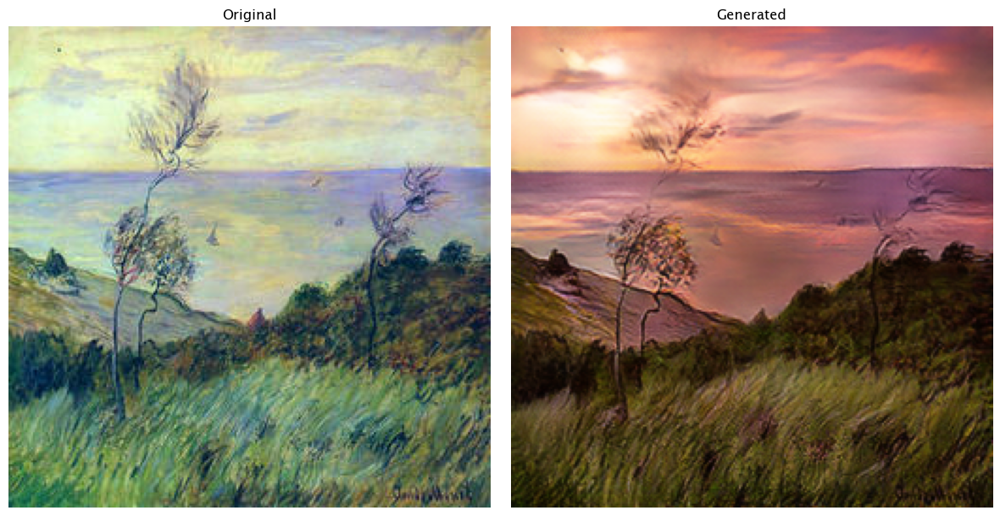

In [33]:
compare_single_pair("results/monet2photo_pretrained/test_monet_latest/images/00020_real.png",
                    "results/monet2photo_pretrained/test_monet_latest/images/00020_fake.png")

compare_single_pair("results/monet2photo_pretrained/test_monet_latest/images/00030_real.png",
                    "results/monet2photo_pretrained/test_monet_latest/images/00030_fake.png")

compare_single_pair("results/monet2photo_pretrained/test_monet_latest/images/00170_real.png",
                    "results/monet2photo_pretrained/test_monet_latest/images/00170_fake.png")